# Vietnamese Identity card localization using U-Net

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
cd drive/'My Drive'/'Colab Notebooks'/rubik_project_v2

/content/drive/My Drive/Colab Notebooks/rubik_project_v2


In [0]:
import cv2
import numpy as np
import os
import random
from IPython.display import display,Image
from matplotlib import pyplot as plt
from glob import glob

import keras
from keras.layers.core import Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D,Conv2DTranspose
from keras.layers.normalization import BatchNormalization
from keras.layers import Concatenate
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
import keras.backend as K
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras import optimizers
from keras.callbacks import ModelCheckpoint,ReduceLROnPlateau,EarlyStopping
import tensorflow as tf


# Data preparing

dataset.zip contain our training dataset, and test.zip contain test set.  
All dataset is collect and capture by us.

## Unzip data

In [0]:
!unzip dataset

Archive:  dataset.zip
   creating: dataset/
   creating: dataset/images/
  inflating: dataset/images/IMG_20190719_192004.jpg  
  inflating: dataset/images/img_325.jpg  
  inflating: dataset/images/img_69.jpg  
  inflating: dataset/images/67195221_2080889135350776_5327510634055598080_n.jpg  
  inflating: dataset/images/img_65.jpg  
  inflating: dataset/images/67433487_427002124823371_3611116869349539840_n.jpg  
  inflating: dataset/images/IMG_20190721_234020.jpg  
  inflating: dataset/images/img_338.jpg  
  inflating: dataset/images/IMG_20190719_184044.jpg  
  inflating: dataset/images/67187594_440682343449323_2198901308545564672_n.jpg  
  inflating: dataset/images/img_55.jpg  
  inflating: dataset/images/img_344.jpg  
  inflating: dataset/images/67468095_487008052055771_3662867321141067776_n.jpg  
  inflating: dataset/images/67119199_500107487483023_5348058685312598016_n.jpg  
  inflating: dataset/images/67116555_353584568647111_9116365142878060544_n.jpg  
  inflating: dataset/images/I

In [0]:
!unzip test.zip

Archive:  test.zip
   creating: test/
   creating: test/test_images/
  inflating: test/test_images/IMG_20190724_174139.jpg  
  inflating: test/test_images/IMG_20190724_174016.jpg  
  inflating: test/test_images/IMG_20190724_173819.jpg  
  inflating: test/test_images/IMG_20190724_173751.jpg  
  inflating: test/test_images/IMG_20190724_174321.jpg  
  inflating: test/test_images/IMG_20190724_173652.jpg  
  inflating: test/test_images/IMG_20190724_174404.jpg  
  inflating: test/test_images/IMG_20190724_174121.jpg  
  inflating: test/test_images/IMG_20190724_174054.jpg  
  inflating: test/test_images/IMG_20190724_173628.jpg  
  inflating: test/test_images/IMG_20190724_173559.jpg  
  inflating: test/test_images/IMG_20190724_173912.jpg  
  inflating: test/test_images/IMG_20190724_173738.jpg  
  inflating: test/test_images/IMG_20190724_174640.jpg  
  inflating: test/test_images/IMG_20190724_173814.jpg  
  inflating: test/test_images/IMG_20190724_174208.jpg  
  inflating: test/test_images/IMG_2

## Generate resized image  
Generate resized image to make the training progress faster

In [0]:
image_mask_paths = [(os.path.join('dataset','images',img_path.replace('png','jpg')),os.path.join('dataset','masks',img_path)) for img_path in os.listdir(os.path.join('dataset','masks'))]
NUMBER_OF_IMAGES=len(image_mask_paths)
print(NUMBER_OF_IMAGES)
print(image_mask_paths[:5])

263
[('dataset/images/IMG_20190719_192004.jpg', 'dataset/masks/IMG_20190719_192004.png'), ('dataset/images/img_325.jpg', 'dataset/masks/img_325.png'), ('dataset/images/67195221_2080889135350776_5327510634055598080_n.jpg', 'dataset/masks/67195221_2080889135350776_5327510634055598080_n.png'), ('dataset/images/img_69.jpg', 'dataset/masks/img_69.png'), ('dataset/images/img_65.jpg', 'dataset/masks/img_65.png')]


In [0]:
!mkdir -p dataset/train_images/train_images
!mkdir -p dataset/train_masks/train_masks

In [0]:
for i,(image_path,mask_path) in enumerate(image_mask_paths):
  print(i,image_path)
  image = cv2.imread(image_path)
  mask = cv2.imread(mask_path)[:,:,2]//128

  if image.shape[0]>image.shape[1]:
    image=np.rot90(image)
    mask=np.rot90(mask)

  image=cv2.resize(image,(1536,864))
  mask=cv2.resize(mask,(1536,864))
  cv2.imwrite(os.path.join('dataset','train_images','train_images','image'+str(i)+'.png'),image)
  cv2.imwrite(os.path.join('dataset','train_masks','train_masks','mask'+str(i)+'.png'),mask)

0 dataset/images/IMG_20190719_192004.jpg
1 dataset/images/img_325.jpg
2 dataset/images/img_69.jpg
3 dataset/images/67195221_2080889135350776_5327510634055598080_n.jpg
4 dataset/images/img_65.jpg
5 dataset/images/67433487_427002124823371_3611116869349539840_n.jpg
6 dataset/images/IMG_20190721_234020.jpg
7 dataset/images/img_338.jpg
8 dataset/images/67187594_440682343449323_2198901308545564672_n.jpg
9 dataset/images/img_55.jpg
10 dataset/images/img_344.jpg
11 dataset/images/67468095_487008052055771_3662867321141067776_n.jpg
12 dataset/images/67119199_500107487483023_5348058685312598016_n.jpg
13 dataset/images/67116555_353584568647111_9116365142878060544_n.jpg
14 dataset/images/img_329.jpg
15 dataset/images/IMG_20190721_234141.jpg
16 dataset/images/img_41.jpg
17 dataset/images/img_78.jpg
18 dataset/images/67481476_705762509847347_8259421379510665216_n.jpg
19 dataset/images/67032711_1075256092865089_5301140282182467584_n.jpg
20 dataset/images/img_331.jpg
21 dataset/images/img_327.jpg
22 da

Visualize our training data

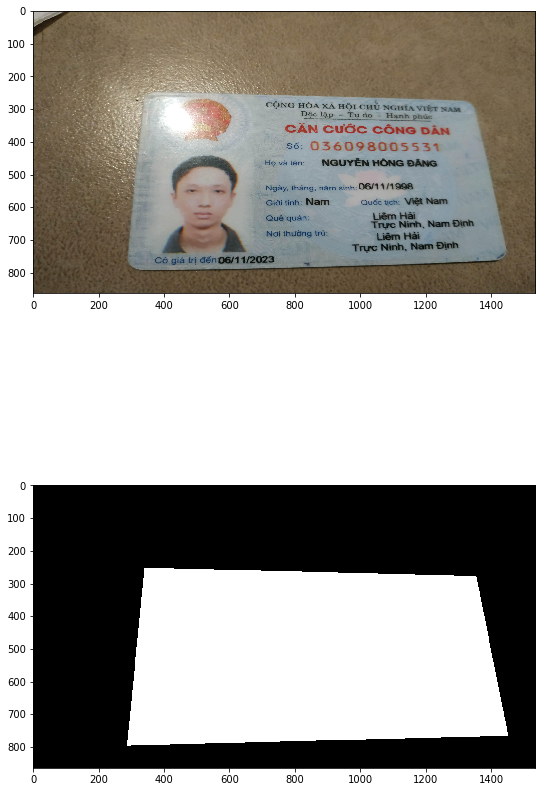

In [0]:
plt.subplots(2,1,figsize=(9,16))
plt.subplot(2,1,1)
plt.imshow(cv2.cvtColor(cv2.imread('dataset/train_images/train_images/image0.png'),cv2.COLOR_BGR2RGB))
plt.subplot(2,1,2)
plt.imshow(cv2.imread('dataset/train_masks/train_masks/mask0.png')*255)

In [0]:
test_image_mask_paths = [(os.path.join('test','test_images',img_path.replace('png','jpg')),os.path.join('test','test_masks',img_path)) for img_path in os.listdir(os.path.join('test','test_masks'))]
NUMBER_OF_TEST=len(test_image_mask_paths)
print(NUMBER_OF_TEST)
print(test_image_mask_paths[:5])

53
[('test/test_images/IMG_20190724_174139.jpg', 'test/test_masks/IMG_20190724_174139.png'), ('test/test_images/IMG_20190724_174016.jpg', 'test/test_masks/IMG_20190724_174016.png'), ('test/test_images/IMG_20190724_173819.jpg', 'test/test_masks/IMG_20190724_173819.png'), ('test/test_images/IMG_20190724_173751.jpg', 'test/test_masks/IMG_20190724_173751.png'), ('test/test_images/IMG_20190724_174321.jpg', 'test/test_masks/IMG_20190724_174321.png')]


In [0]:
!mkdir -p test/true_test_images/test_images
!mkdir -p test/true_test_masks/test_masks

In [0]:
for i,(image_path,mask_path) in enumerate(test_image_mask_paths):
  print(i,image_path)
  image = cv2.imread(image_path)
  mask = cv2.imread(mask_path)[:,:,2]//128

  if image.shape[0]>image.shape[1]:
    image=np.rot90(image)
    mask=np.rot90(mask)

  image=cv2.resize(image,(1536,864))
  mask=cv2.resize(mask,(1536,864))
  cv2.imwrite(os.path.join('test','true_test_images','test_images','image'+str(i)+'.png'),image)
  cv2.imwrite(os.path.join('test','true_test_masks','test_masks','mask'+str(i)+'.png'),mask)

0 test/test_images/IMG_20190724_174139.jpg
1 test/test_images/IMG_20190724_174016.jpg
2 test/test_images/IMG_20190724_173819.jpg
3 test/test_images/IMG_20190724_173751.jpg
4 test/test_images/IMG_20190724_174321.jpg
5 test/test_images/IMG_20190724_173652.jpg
6 test/test_images/IMG_20190724_174404.jpg
7 test/test_images/IMG_20190724_174121.jpg
8 test/test_images/IMG_20190724_174054.jpg
9 test/test_images/IMG_20190724_173628.jpg
10 test/test_images/IMG_20190724_173559.jpg
11 test/test_images/IMG_20190724_173912.jpg
12 test/test_images/IMG_20190724_173738.jpg
13 test/test_images/IMG_20190724_174640.jpg
14 test/test_images/IMG_20190724_173814.jpg
15 test/test_images/IMG_20190724_174208.jpg
16 test/test_images/IMG_20190724_173928.jpg
17 test/test_images/IMG_20190724_174147.jpg
18 test/test_images/IMG_20190724_173900.jpg
19 test/test_images/IMG_20190724_173619.jpg
20 test/test_images/IMG_20190724_173806.jpg
21 test/test_images/IMG_20190724_174044.jpg
22 test/test_images/IMG_20190724_174419.jp

Visualize our test data

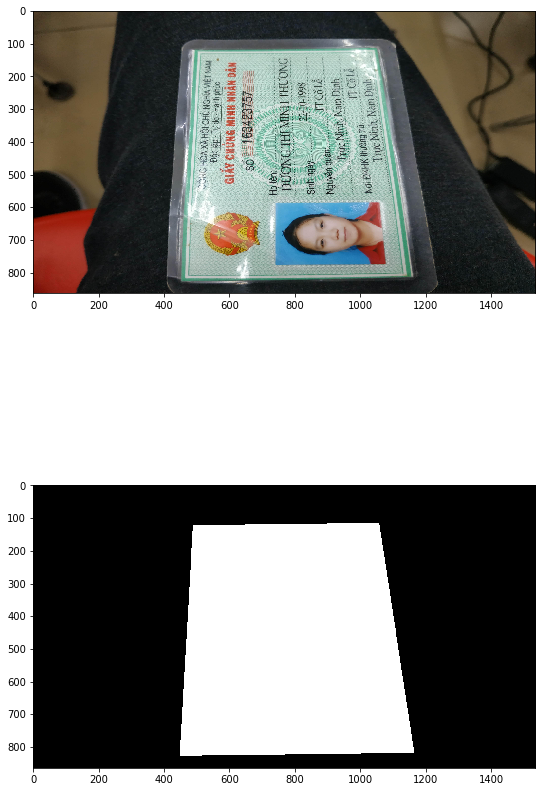

In [0]:
plt.subplots(2,1,figsize=(9,16))
plt.subplot(2,1,1)
plt.imshow(cv2.cvtColor(cv2.imread('test/true_test_images/test_images/image0.png'),cv2.COLOR_BGR2RGB))
plt.subplot(2,1,2)
plt.imshow(cv2.imread('test/true_test_masks/test_masks/mask0.png')*255)

## Images augmentation

In [0]:
image_datagen=ImageDataGenerator(rotation_range=30,width_shift_range=0.01,height_shift_range=0.01,zoom_range=[0.9,1.1],shear_range=0.01,brightness_range=[0.95,1.05],fill_mode='constant',cval=0,preprocessing_function=preprocess_input)

In [0]:
mask_datagen=ImageDataGenerator(rotation_range=30,width_shift_range=0.01,height_shift_range=0.01,zoom_range=[0.9,1.1],shear_range=0.01,fill_mode='constant',cval=0)

In [0]:
seed=42
NUMBER_OF_IMAGES=263
image_generator = image_datagen.flow_from_directory(
    'dataset/train_images',
    target_size=(864,1536),
    class_mode=None,
    color_mode='rgb',
    batch_size=1,
    seed=seed)

mask_generator = mask_datagen.flow_from_directory(
    'dataset/train_masks',
    target_size=(864,1536),
    class_mode=None,
    color_mode='grayscale',
    batch_size=1,
    seed=seed)

train_generator=zip(image_generator,mask_generator)

Found 263 images belonging to 1 classes.
Found 263 images belonging to 1 classes.


W0724 00:03:22.952653 140139373246336 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 864, 1536, 3)
[[[[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  ...

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [

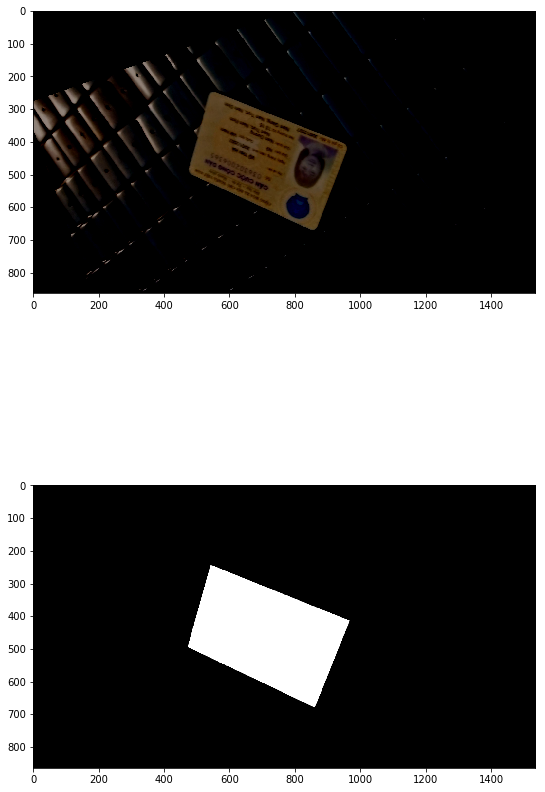

In [0]:
img,mask=next(train_generator)
print(img.shape)
print(img)
print(mask.shape)
plt.subplots(2,1,figsize=(9,16))
plt.subplot(2,1,1)
plt.imshow(img[0]/255)
mask_rgb= np.squeeze(np.stack((mask[0],)*3, axis=-1))
print(mask_rgb.shape)
plt.subplot(2,1,2)
plt.imshow(mask_rgb)

In [0]:
seed=42
test_image_generator = image_datagen.flow_from_directory(
    'test/true_test_images',
    target_size=(864,1536),
    class_mode=None,
    color_mode='rgb',
    batch_size=1,
    seed=seed)

test_mask_generator = mask_datagen.flow_from_directory(
    'test/true_test_masks',
    target_size=(864,1536),
    class_mode=None,
    color_mode='grayscale',
    batch_size=1,
    seed=seed)

test_generator=zip(test_image_generator,test_mask_generator)

Found 53 images belonging to 1 classes.
Found 53 images belonging to 1 classes.


W0724 11:28:12.491668 140139373246336 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 864, 1536, 3)
[[[[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  ...

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]]

  [[-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [

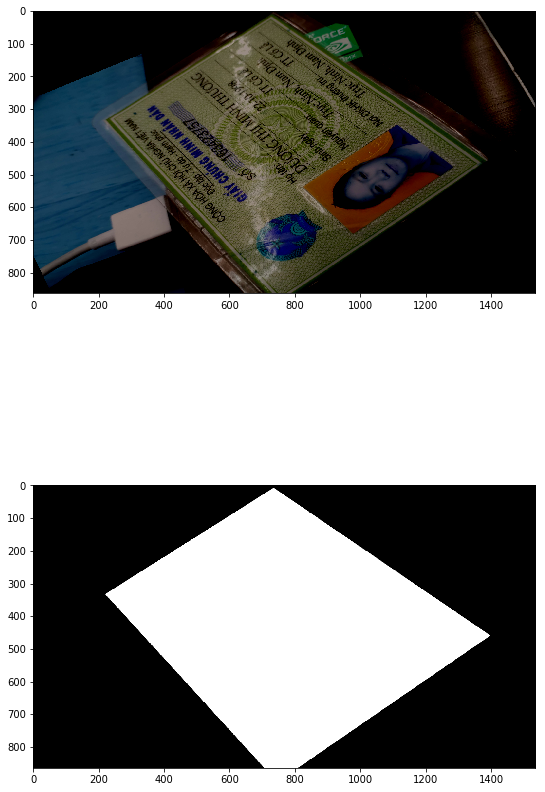

In [0]:
img,mask=next(test_generator)
print(img.shape)
print(img)
print(mask.shape)
plt.subplots(2,1,figsize=(9,16))
plt.subplot(2,1,1)
plt.imshow(img[0]/255)
mask_rgb= np.squeeze(np.stack((mask[0],)*3, axis=-1))
print(mask_rgb.shape)
plt.subplot(2,1,2)
plt.imshow(mask_rgb)

# Model building

Load pretrain VGG16

In [0]:
vgg16=VGG16(include_top=False,weights='imagenet',input_shape=(864,1536,3))

encoder=Model(inputs=vgg16.input,outputs=vgg16.output)
encoder.summary()

W0724 00:03:49.574310 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0724 00:03:49.611043 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0724 00:03:49.617916 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0724 00:03:49.660404 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



58892288/58889256 [==============================] - 1s 0us/step


W0724 00:03:51.157151 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0724 00:03:51.158044 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 864, 1536, 3)      0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 864, 1536, 64)     1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 864, 1536, 64)     36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 432, 768, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 432, 768, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 432, 768, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 216, 384, 128)     0         
__________

In [0]:
# Get tensor name and index
for i,layer in enumerate(encoder.layers):
  print(i,layer.output.shape,layer.output.name)

0 (?, 864, 1536, 3) input_1:0
1 (?, 864, 1536, 64) block1_conv1/Relu:0
2 (?, 864, 1536, 64) block1_conv2/Relu:0
3 (?, 432, 768, 64) block1_pool/MaxPool:0
4 (?, 432, 768, 128) block2_conv1/Relu:0
5 (?, 432, 768, 128) block2_conv2/Relu:0
6 (?, 216, 384, 128) block2_pool/MaxPool:0
7 (?, 216, 384, 256) block3_conv1/Relu:0
8 (?, 216, 384, 256) block3_conv2/Relu:0
9 (?, 216, 384, 256) block3_conv3/Relu:0
10 (?, 108, 192, 256) block3_pool/MaxPool:0
11 (?, 108, 192, 512) block4_conv1/Relu:0
12 (?, 108, 192, 512) block4_conv2/Relu:0
13 (?, 108, 192, 512) block4_conv3/Relu:0
14 (?, 54, 96, 512) block4_pool/MaxPool:0
15 (?, 54, 96, 512) block5_conv1/Relu:0
16 (?, 54, 96, 512) block5_conv2/Relu:0
17 (?, 54, 96, 512) block5_conv3/Relu:0
18 (?, 27, 48, 512) block5_pool/MaxPool:0


In [0]:
block1,pool1,block2,pool2,block3,pool3,block4,pool4,block5,pool5=encoder.layers[2].output,encoder.layers[3].output,encoder.layers[5].output,encoder.layers[6].output,encoder.layers[9].output,encoder.layers[10].output,encoder.layers[13].output,encoder.layers[14].output,encoder.layers[17].output,encoder.layers[18].output

Build model

In [0]:

block6_conv1=Conv2D(filters=1024,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(pool5)
block6_conv2=Conv2D(filters=1024,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(block6_conv1)

decoder1_up=Conv2DTranspose(filters=512,kernel_size=(4,4),strides=(2,2),padding='same')(block6_conv2)
decoder1_concat=Concatenate()([block5,decoder1_up])
decoder1_conv1=Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder1_concat)
decoder1_conv2=Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder1_conv1)
decoder1_conv3=Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder1_conv2)

decoder2_up=Conv2DTranspose(filters=512,kernel_size=(4,4),strides=(2,2),padding='same')(decoder1_conv3)
decoder2_concat=Concatenate()([block4,decoder2_up])
decoder2_conv1=Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder2_concat)
decoder2_conv2=Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder2_conv1)
decoder2_conv3=Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder2_conv2)

decoder3_up=Conv2DTranspose(filters=256,kernel_size=(4,4),strides=(2,2),padding='same')(decoder2_conv3)
decoder3_concat=Concatenate()([block3,decoder3_up])
decoder3_conv1=Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder3_concat)
decoder3_conv2=Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder3_conv1)

decoder4_up=Conv2DTranspose(filters=128,kernel_size=(4,4),strides=(2,2),padding='same')(decoder3_conv2)
decoder4_concat=Concatenate()([block2,decoder4_up])
decoder4_conv1=Conv2D(filters=128,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder4_concat)
decoder4_conv2=Conv2D(filters=128,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder4_conv1)

decoder5_up=Conv2DTranspose(filters=64,kernel_size=(4,4),strides=(2,2),padding='same')(decoder4_conv2)
decoder5_concat=Concatenate()([block1,decoder5_up])
decoder5_conv1=Conv2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder5_concat)
decoder5_conv2=Conv2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu')(decoder5_conv1)

unet_output=Conv2D(filters=1,kernel_size=(1,1),strides=(1,1),activation='sigmoid')(decoder5_conv2)

UNet=Model(inputs=vgg16.input,outputs=[unet_output])
for layer in encoder.layers:
  layer.trainable=False
UNet.summary()





__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 864, 1536, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 864, 1536, 64 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 864, 1536, 64 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 432, 768, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

In [0]:
# Dice coefficient metric
def dice_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(y_true * y_pred, axis=[1,2,3])
  union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
  return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

In [0]:
# BCE Cross entropy and Dice coefficient loss
def bce_dice_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)

In [0]:
def true_positives_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)

In [0]:
!mkdir checkpoints

# Fine tune U-Net with VGG16 as encoder

## Frozen VGG16 layers, train on decoder layers

In [0]:
model_checkpoint=ModelCheckpoint(os.path.join('checkpoints','best_unet.hdf5'),monitor='loss',save_best_only=True)
reduce_lr=ReduceLROnPlateau(monitor='loss', factor=0.1, patience=3,verbose=1)
early_stop=EarlyStopping(monitor='loss', min_delta=0, patience=5, restore_best_weights=True,verbose=1)

UNet.compile(optimizer=optimizers.Adam(lr=1e-4), loss='binary_crossentropy', metrics=['accuracy',dice_coef,true_positives_rate])
history=UNet.fit_generator(train_generator,epochs=20,steps_per_epoch=NUMBER_OF_IMAGES, callbacks=[model_checkpoint,reduce_lr,early_stop],workers=3)


W0724 00:04:21.753369 140139373246336 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0724 00:04:21.764197 140139373246336 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/20
263/263 [==============================] - 385s 1s/step - loss: 1.9318 - acc: 0.8630 - dice_coef: 0.7062 - true_positives_rate: 0.7100
Epoch 2/20
263/263 [==============================] - 334s 1s/step - loss: 0.5022 - acc: 0.9651 - dice_coef: 0.9325 - true_positives_rate: 0.9407
Epoch 3/20
263/263 [==============================] - 333s 1s/step - loss: 0.3394 - acc: 0.9754 - dice_coef: 0.9523 - true_positives_rate: 0.9576
Epoch 4/20
263/263 [==============================] - 334s 1s/step - loss: 0.2273 - acc: 0.9826 - dice_coef: 0.9683 - true_positives_rate: 0.9706
Epoch 5/20
263/263 [==============================] - 333s 1s/step - loss: 0.1391 - acc: 0.9884 - dice_coef: 0.9784 - true_positives_rate: 0.9793
Epoch 6/20
263/263 [==============================] - 334s 1s/step - loss: 0.2122 - acc: 0.9830 - dice_coef: 0.9686 - true_positives_rate: 0.9700
Epoch 7/20
263/263 [==============================] - 332s 1s/step - loss: 0.1442 - acc: 0.9894 - dice_coef: 0.9798 - true_p

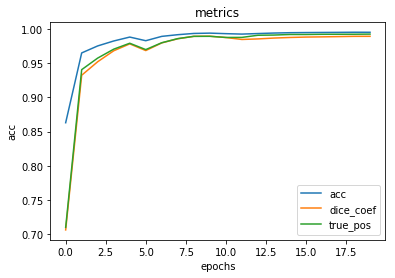

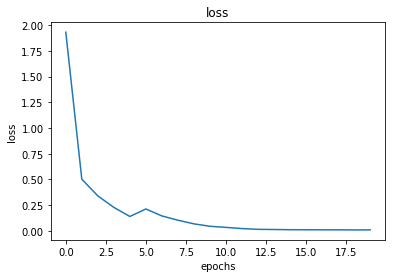

In [0]:
# summarize history for loss

plt.plot(history.history['acc'])
plt.plot(history.history['dice_coef'])
plt.plot(history.history['true_positives_rate'])
plt.title('metrics')
plt.ylabel('acc')
plt.xlabel('epochs')
plt.legend(['acc', 'dice_coef','true_pos'], loc='lower right')
plt.show()

plt.title('loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.plot(history.history['loss'])
plt.show()

In [0]:
from keras.models import load_model
best_UNet = load_model('checkpoints/best_unet.hdf5',custom_objects={'dice_coef':dice_coef,'true_positives_rate':true_positives_rate})
best_UNet.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 864, 1536, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 864, 1536, 64 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 864, 1536, 64 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 432, 768, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

## Train on whole model

In [0]:
for layer in best_UNet.layers:
  layer.trainable=True

model_checkpoint=ModelCheckpoint(os.path.join('checkpoints','best_unet_v2.hdf5'),monitor='loss',save_best_only=True)
reduce_lr=ReduceLROnPlateau(monitor='loss', factor=0.1, patience=3,verbose=1)
early_stop=EarlyStopping(monitor='loss', min_delta=0, patience=5, restore_best_weights=True,verbose=1) 
  
best_UNet.compile(optimizer=optimizers.Adam(lr=1e-6,decay=1e-8), loss='binary_crossentropy', metrics=['accuracy',dice_coef,true_positives_rate])
history2=best_UNet.fit_generator(train_generator,epochs=30,steps_per_epoch=NUMBER_OF_IMAGES, callbacks=[model_checkpoint,reduce_lr,early_stop],workers=3)

Epoch 1/30
263/263 [==============================] - 345s 1s/step - loss: 0.0877 - acc: 0.9896 - dice_coef: 0.9767 - true_positives_rate: 0.9814
Epoch 2/30
263/263 [==============================] - 338s 1s/step - loss: 0.0083 - acc: 0.9954 - dice_coef: 0.9884 - true_positives_rate: 0.9932
Epoch 3/30
263/263 [==============================] - 337s 1s/step - loss: 0.0081 - acc: 0.9954 - dice_coef: 0.9891 - true_positives_rate: 0.9937
Epoch 4/30
263/263 [==============================] - 337s 1s/step - loss: 0.0076 - acc: 0.9957 - dice_coef: 0.9897 - true_positives_rate: 0.9938
Epoch 5/30
263/263 [==============================] - 336s 1s/step - loss: 0.0077 - acc: 0.9956 - dice_coef: 0.9899 - true_positives_rate: 0.9939
Epoch 6/30
263/263 [==============================] - 336s 1s/step - loss: 0.0075 - acc: 0.9957 - dice_coef: 0.9901 - true_positives_rate: 0.9940
Epoch 7/30
263/263 [==============================] - 336s 1s/step - loss: 0.0076 - acc: 0.9957 - dice_coef: 0.9902 - true_p

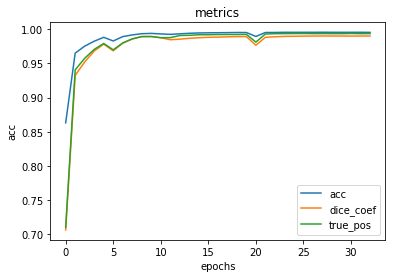

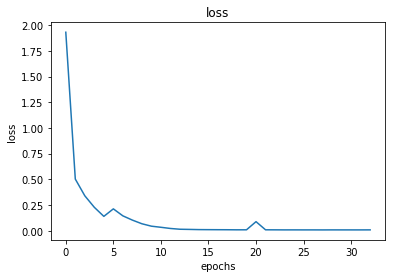

In [0]:
all_history={key:history.history[key]+history2.history[key] for key in history.history.keys() }
# summarize history for loss

plt.plot(all_history['acc'])
plt.plot(all_history['dice_coef'])
plt.plot(all_history['true_positives_rate'])
plt.title('metrics')
plt.ylabel('acc')
plt.xlabel('epochs')
plt.legend(['acc', 'dice_coef','true_pos'], loc='lower right')
plt.show()

plt.title('loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.plot(all_history['loss'])
plt.show()

## Evaluate model on test set

In [0]:
best_UNet.metrics_names

['loss', 'acc', 'dice_coef', 'true_positives_rate']

In [0]:
best_UNet.evaluate_generator(test_generator,verbose=1,steps=1000)

1000/1000 [==============================] - 642s 642ms/step


[0.041468663152307274,
 0.9910978652834892,
 0.9850570580363274,
 0.9952558678984642]

# Testing and visualizing

In [0]:
from keras.models import load_model
best_UNet = load_model('checkpoints/best_unet_v2.hdf5',custom_objects={'dice_coef':dice_coef,'true_positives_rate':true_positives_rate})
best_UNet.summary()

W0724 19:14:41.402051 140567150233472 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0724 19:14:41.461245 140567150233472 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0724 19:14:41.511490 140567150233472 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0724 19:14:44.917156 140567150233472 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0724 19:14:44.918297 140567150233472 deprecation_

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 864, 1536, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 864, 1536, 64 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 864, 1536, 64 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 432, 768, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

In [0]:
from keras.preprocessing import image

def predict(model,path):
  img = image.load_img(path, target_size=(864,1536))
  ori_img = image.img_to_array(img)
  img=preprocess_input(ori_img)
  img_in = np.expand_dims(img, axis=0)
  ret=(model.predict(img_in)[0]>0.5).astype(np.float32)
  print(ret.shape)
  
  plt.subplots(2,1,figsize=(9,16))
  plt.subplot(2,1,1)
  plt.imshow(ori_img/255+0.5)
  ret_rgb= np.squeeze(np.stack((ret,)*3, axis=-1))
  plt.subplot(2,1,2)
  plt.imshow(ret_rgb)
  plt.show()

    

image104.png
(864, 1536, 1)


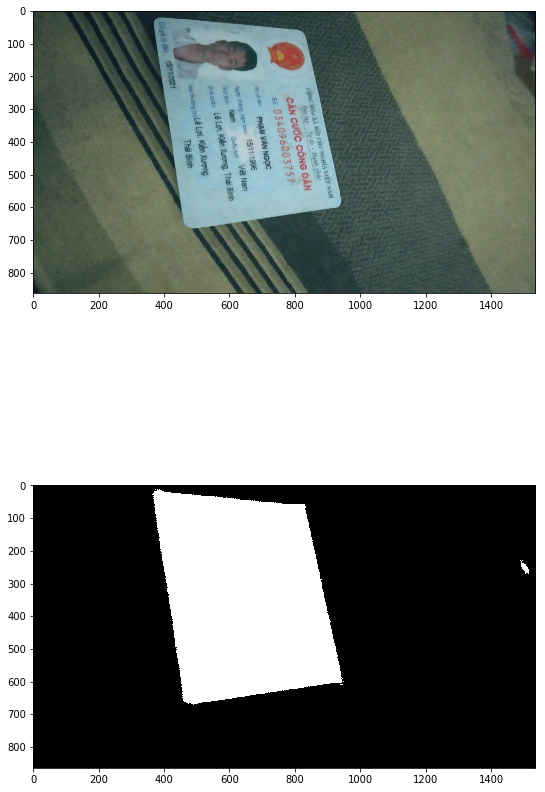

image182.png
(864, 1536, 1)


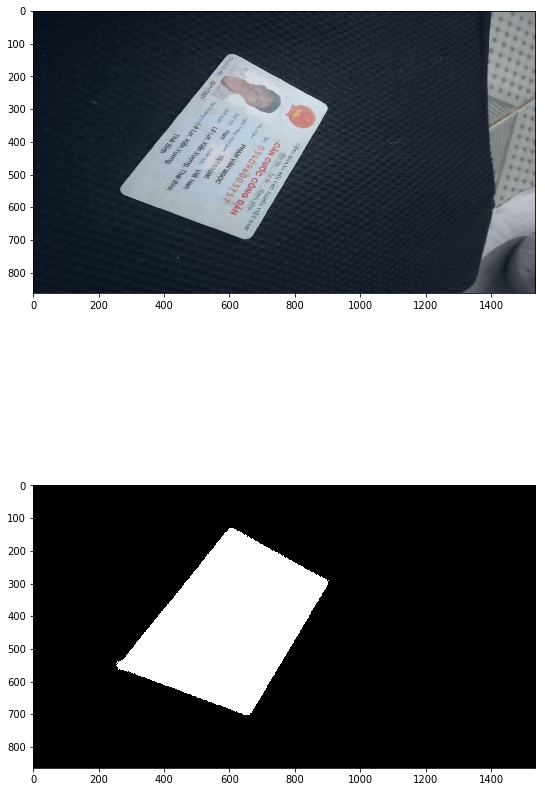

image194.png


W0724 19:24:53.153839 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


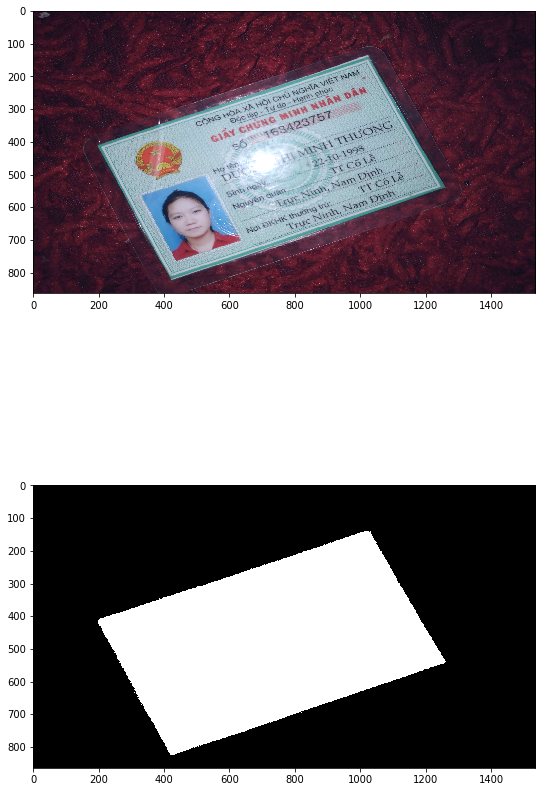

image221.png


W0724 19:24:54.968384 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


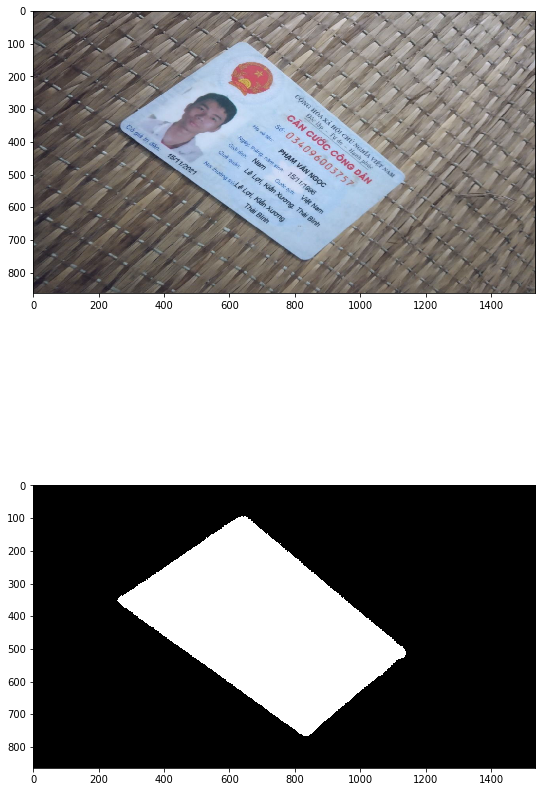

image1.png


W0724 19:24:56.590788 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


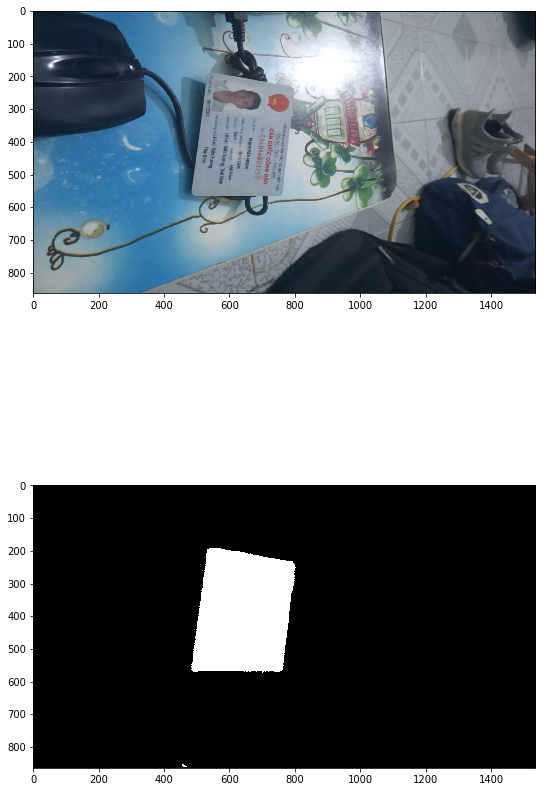

image232.png


W0724 19:24:58.357776 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


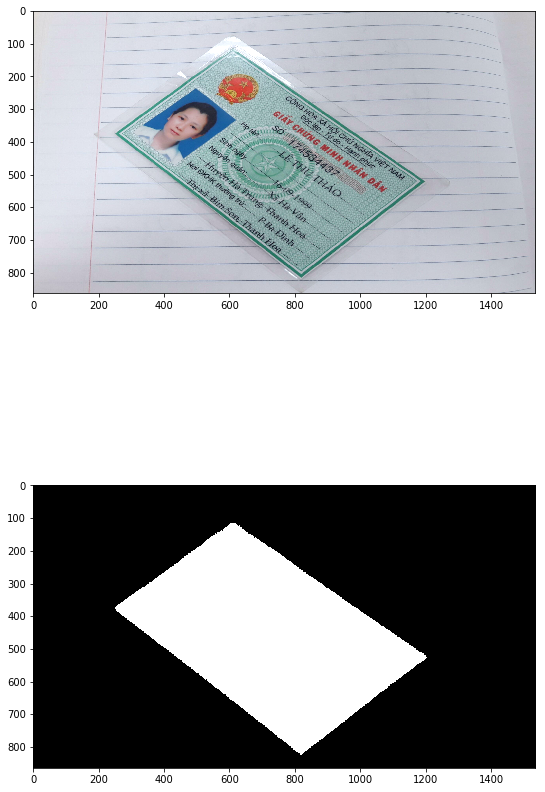

image127.png
(864, 1536, 1)


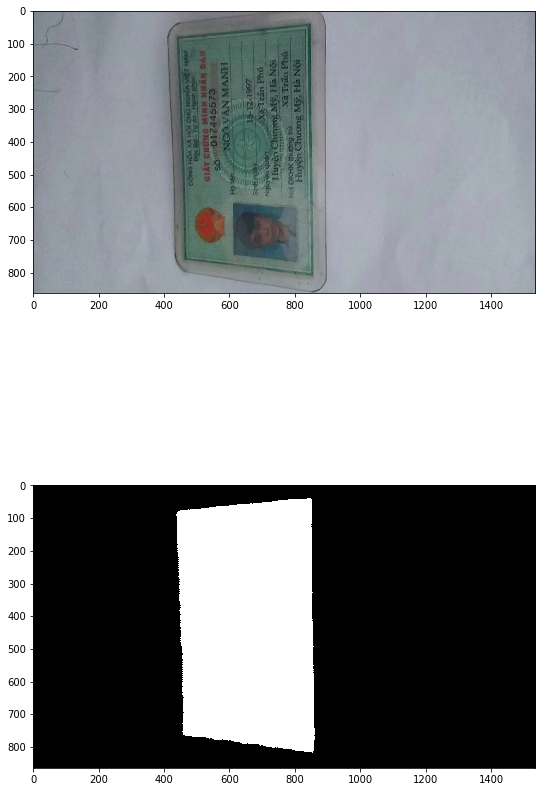

image125.png
(864, 1536, 1)


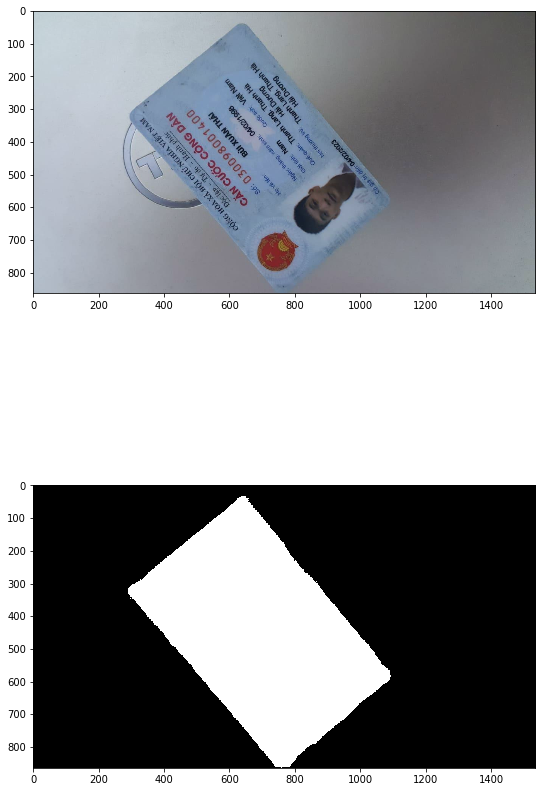

image225.png


W0724 19:25:03.060348 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


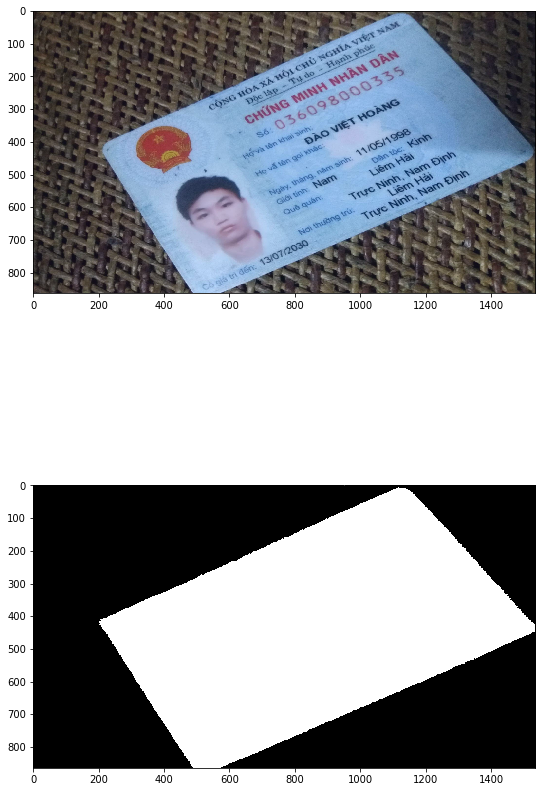

image28.png


W0724 19:25:04.942796 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


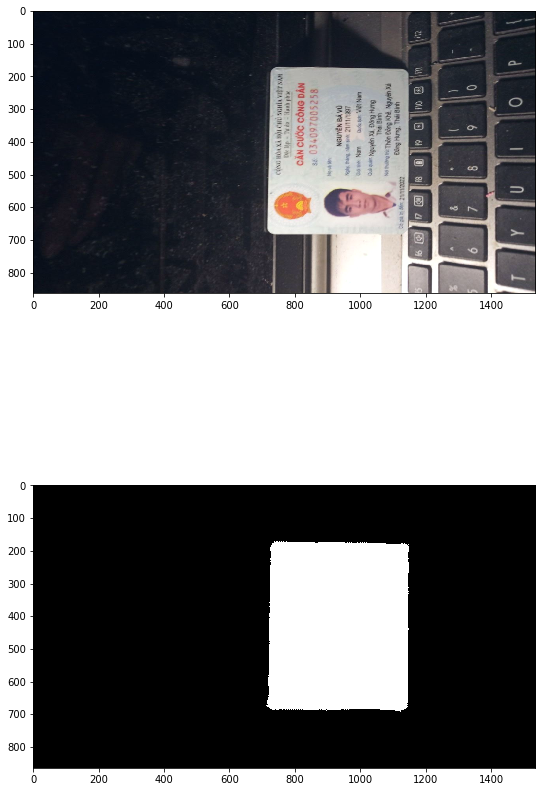

image252.png


W0724 19:25:06.690418 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


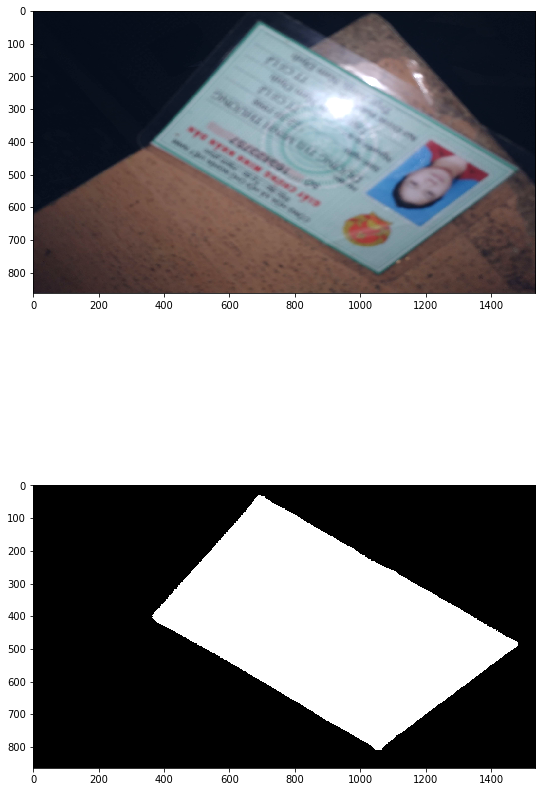

image261.png
(864, 1536, 1)


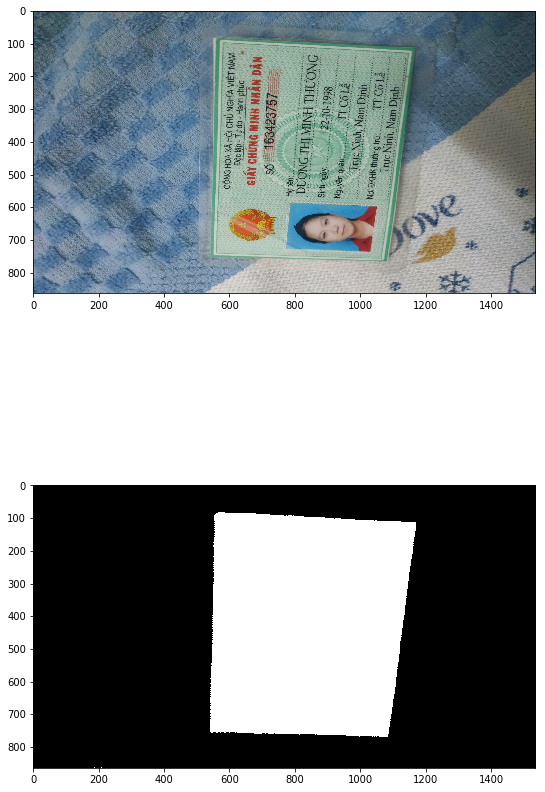

image11.png


W0724 19:25:09.975097 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


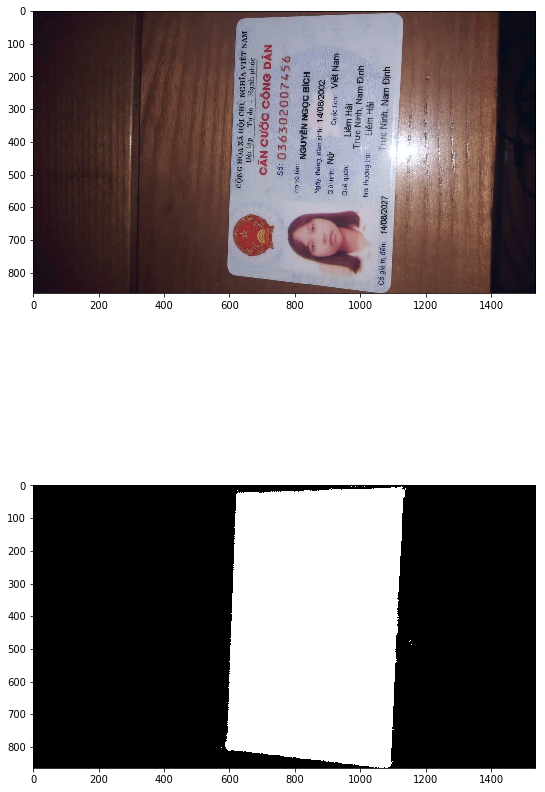

image52.png


W0724 19:25:11.753410 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


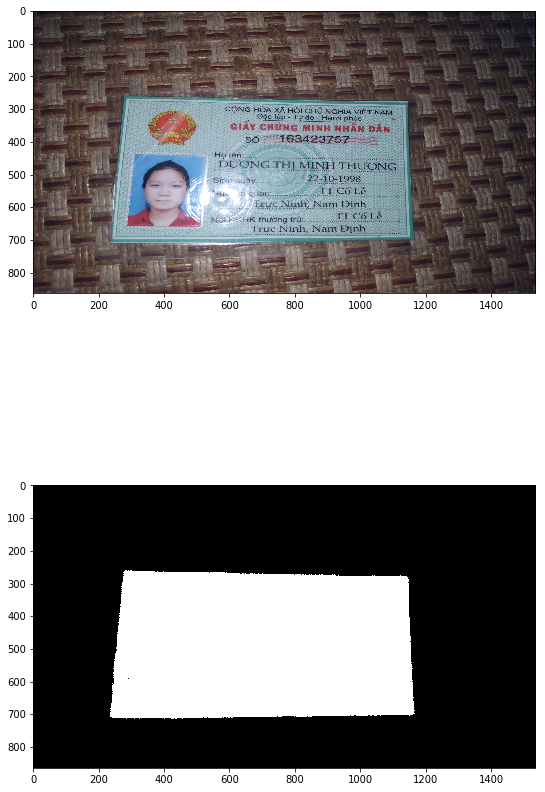

image105.png


W0724 19:25:13.510385 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


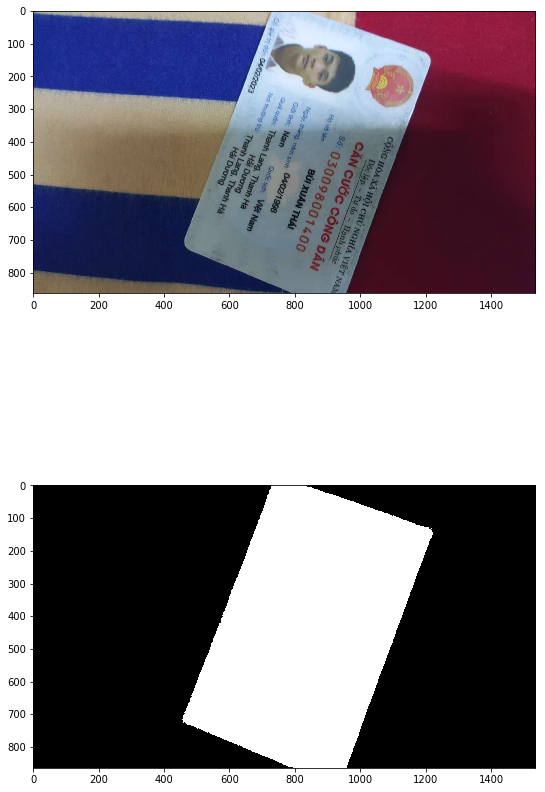

image260.png


W0724 19:25:15.242211 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


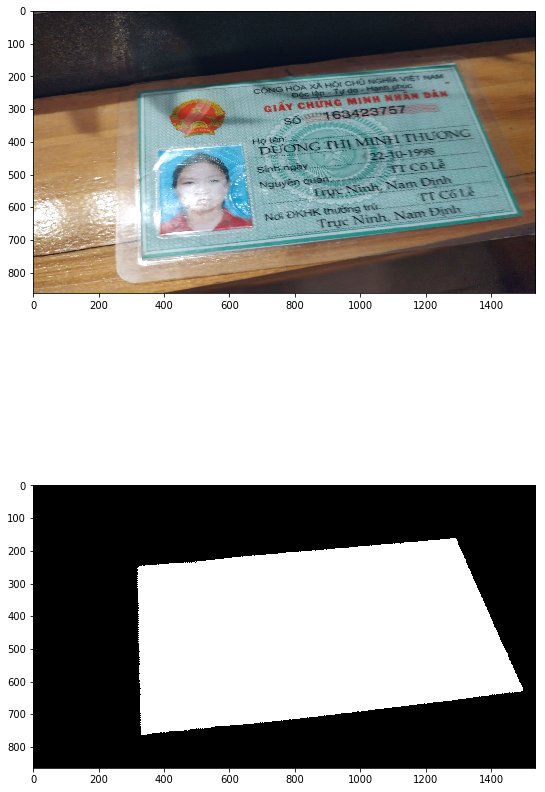

image140.png


W0724 19:25:17.006022 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


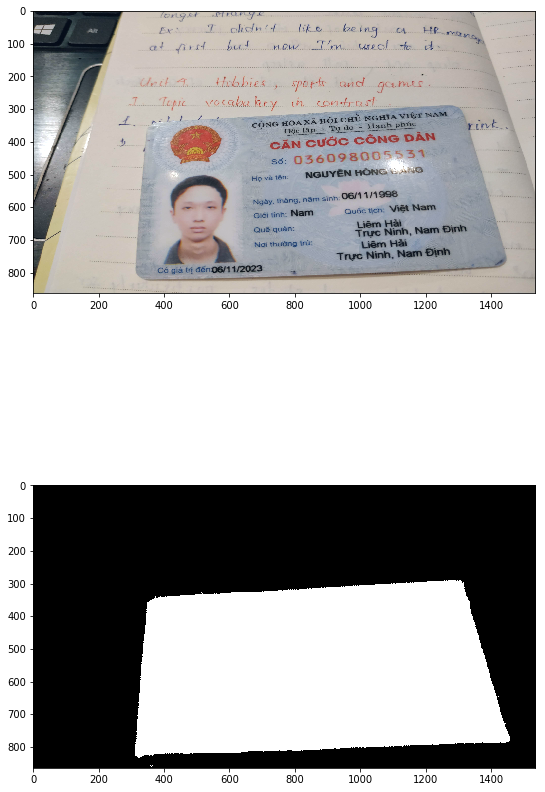

image239.png


W0724 19:25:18.803596 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


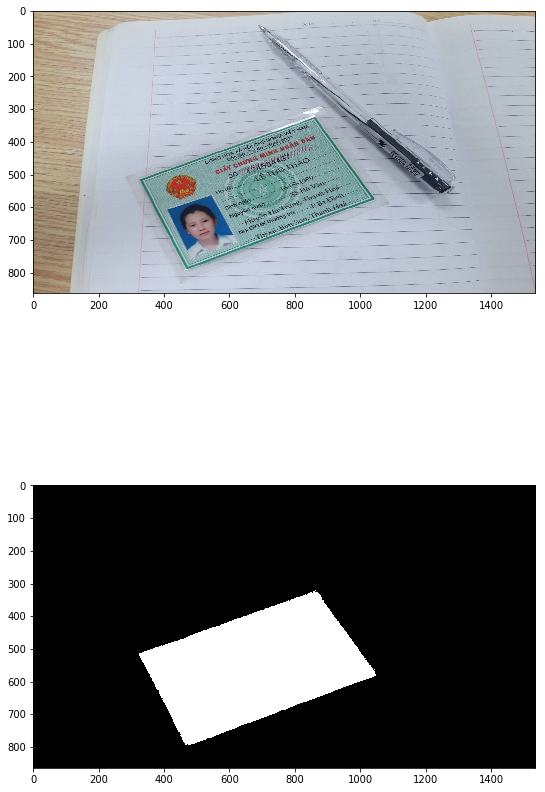

image209.png


W0724 19:25:20.721246 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


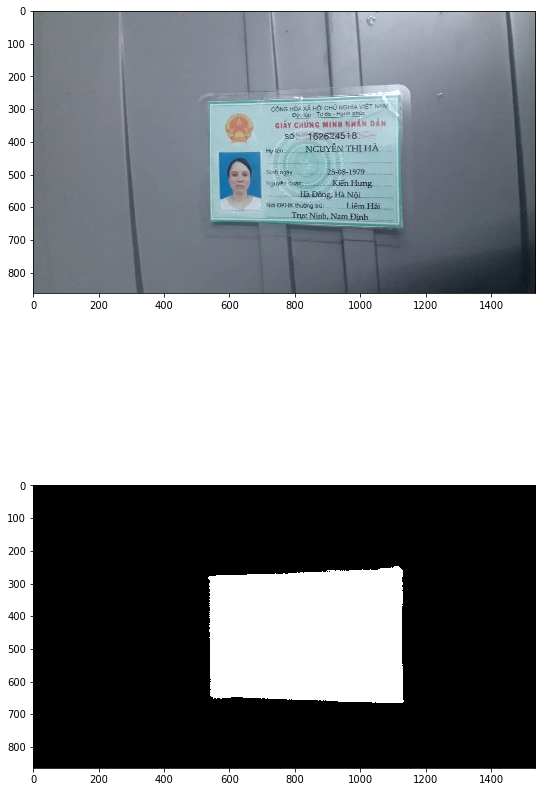

image1.png


W0724 19:25:21.952111 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


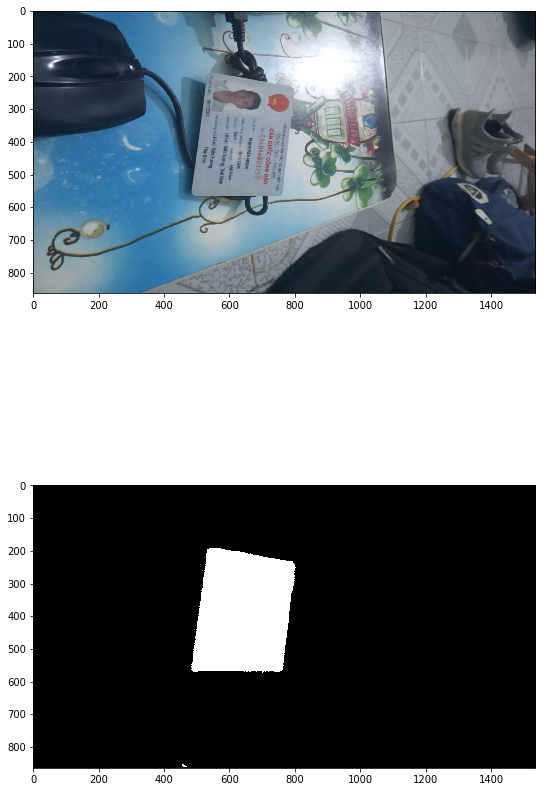

In [0]:
for path in random.choices(os.listdir('dataset/train_images/train_images'),k=20):
  print(path)
  predict(best_UNet,'dataset/train_images/train_images/'+path)

image4.png


W0724 19:25:36.452775 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


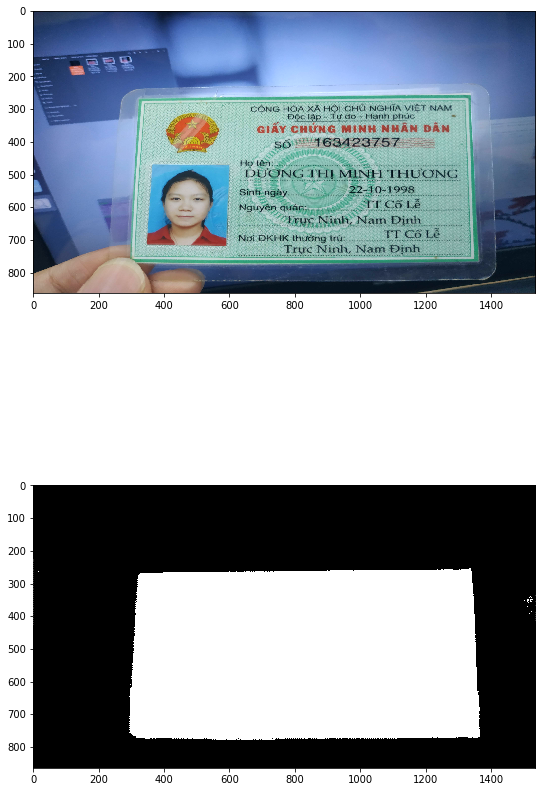

image36.png


W0724 19:25:38.144440 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


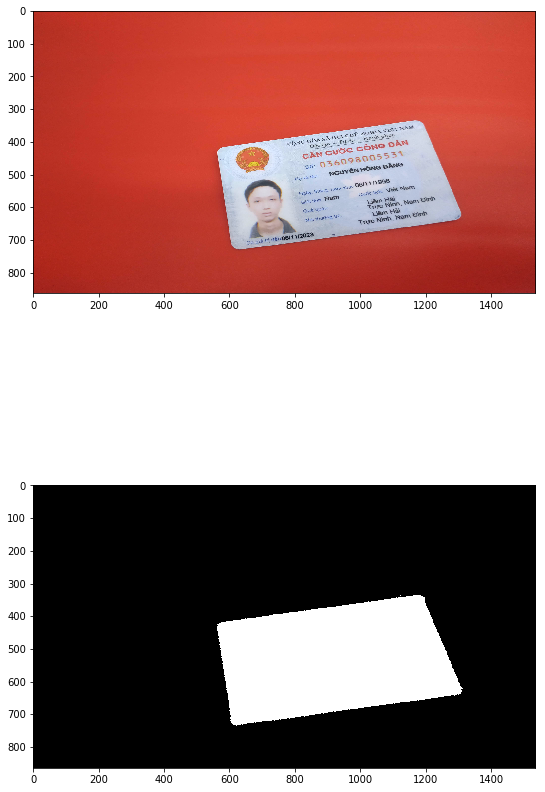

image50.png


W0724 19:25:39.886339 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


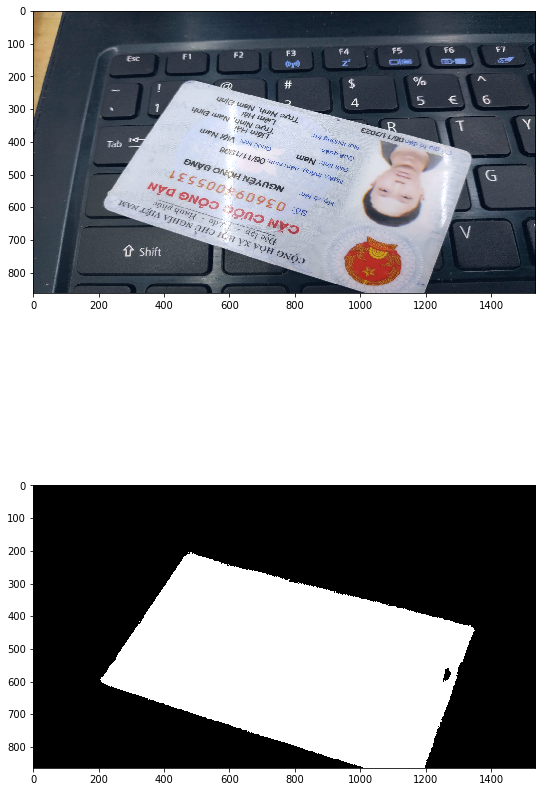

image29.png


W0724 19:25:41.177617 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


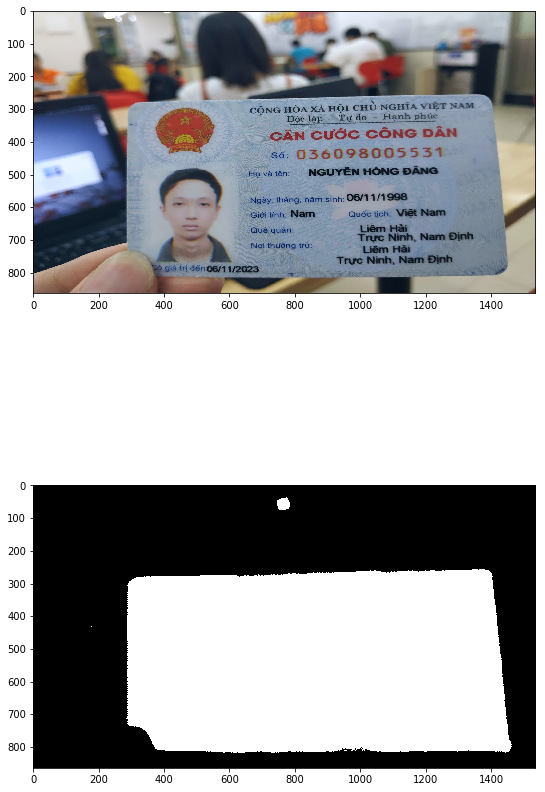

image47.png


W0724 19:25:42.472734 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


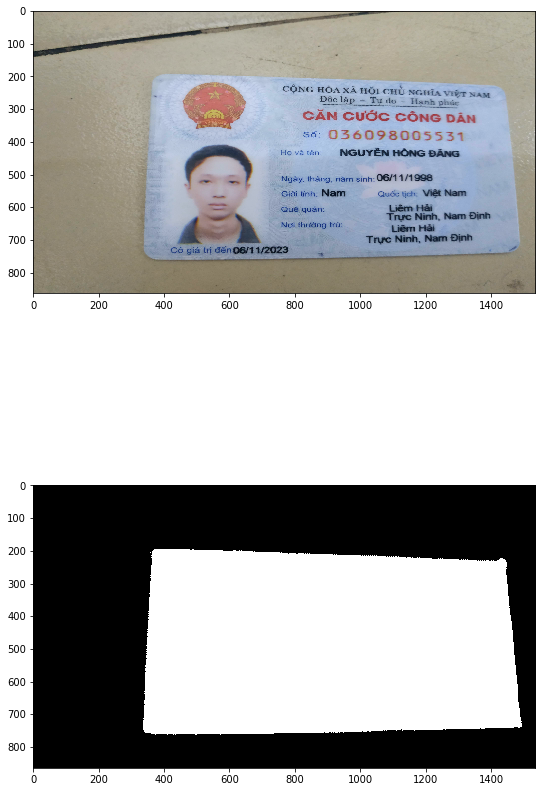

image43.png


W0724 19:25:44.552963 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


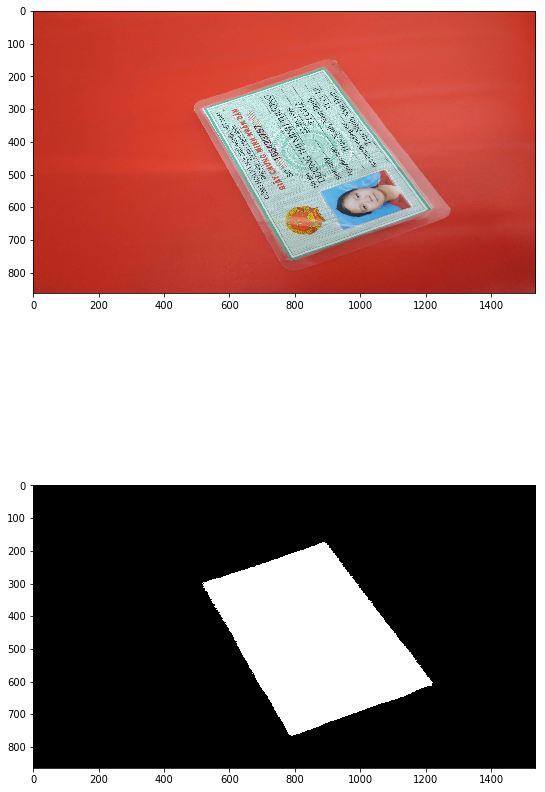

image17.png


W0724 19:25:46.370836 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


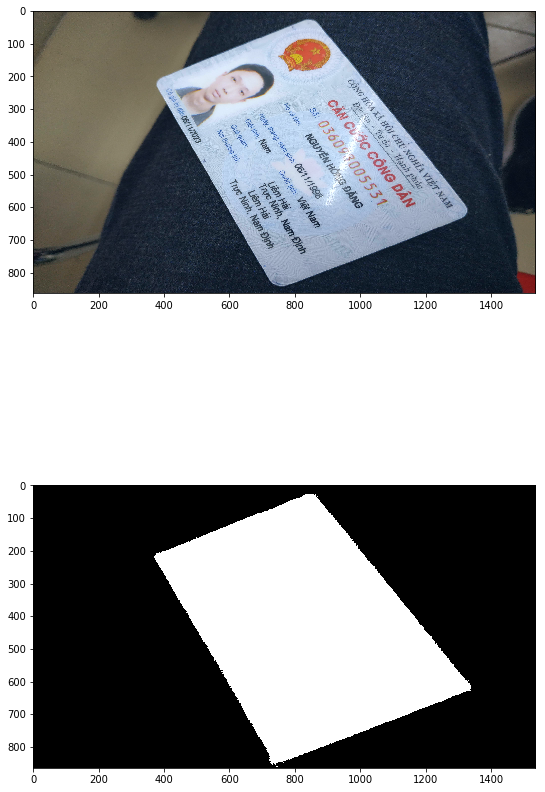

image0.png


W0724 19:25:48.360419 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


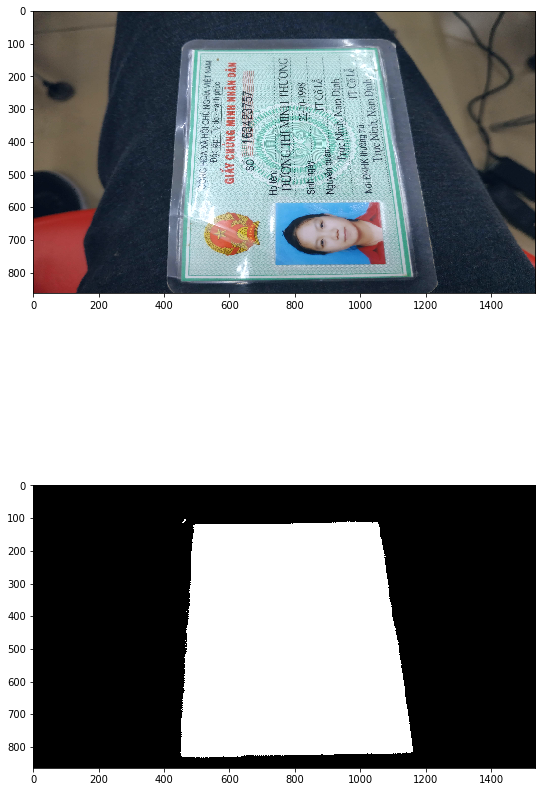

image46.png


W0724 19:25:50.189918 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


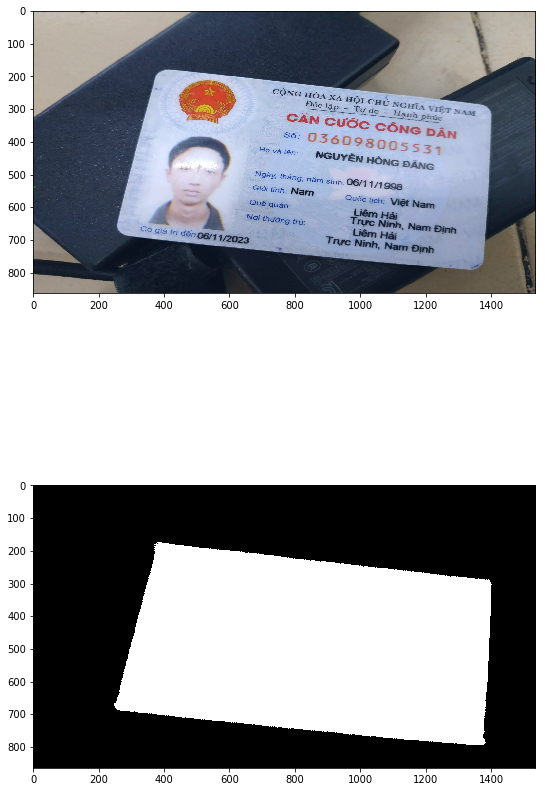

image28.png


W0724 19:25:51.959801 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


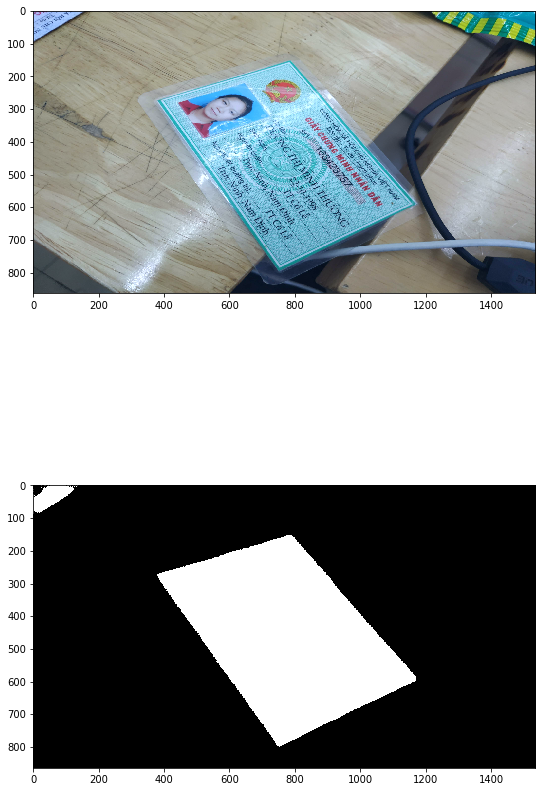

image30.png


W0724 19:25:53.245679 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


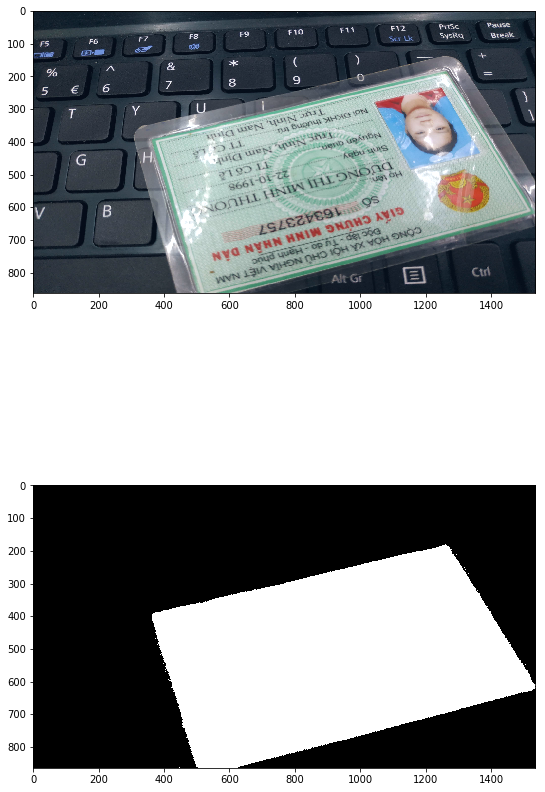

image40.png


W0724 19:25:55.018405 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


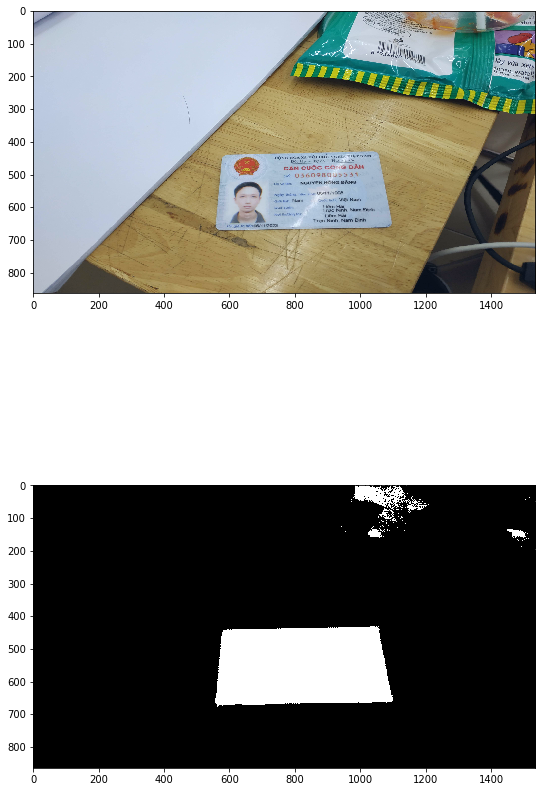

image11.png


W0724 19:25:56.777723 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


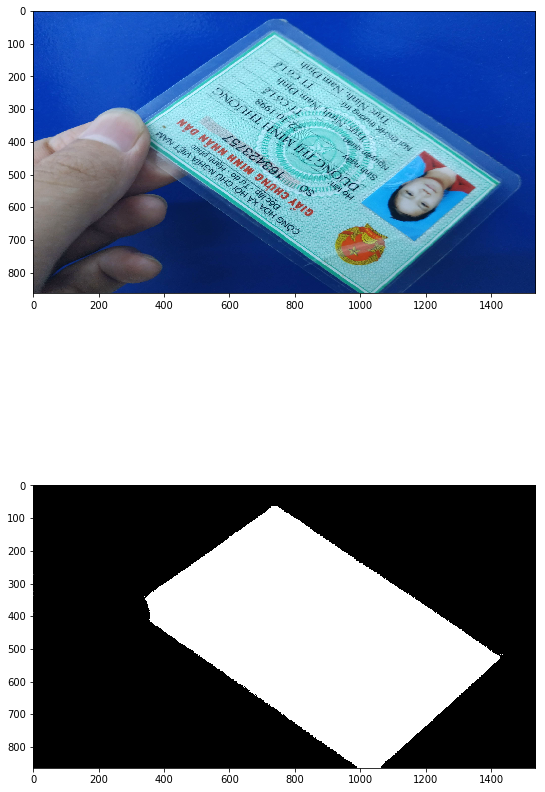

image52.png


W0724 19:25:58.535048 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


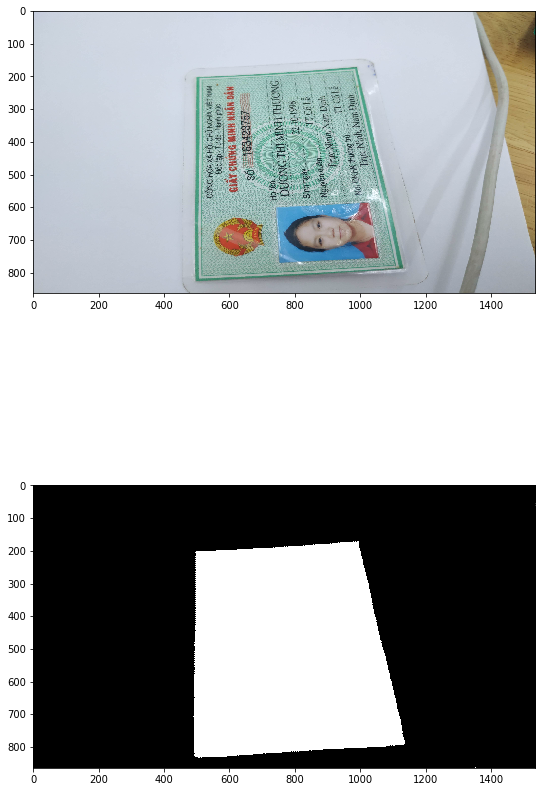

image49.png


W0724 19:26:00.275359 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


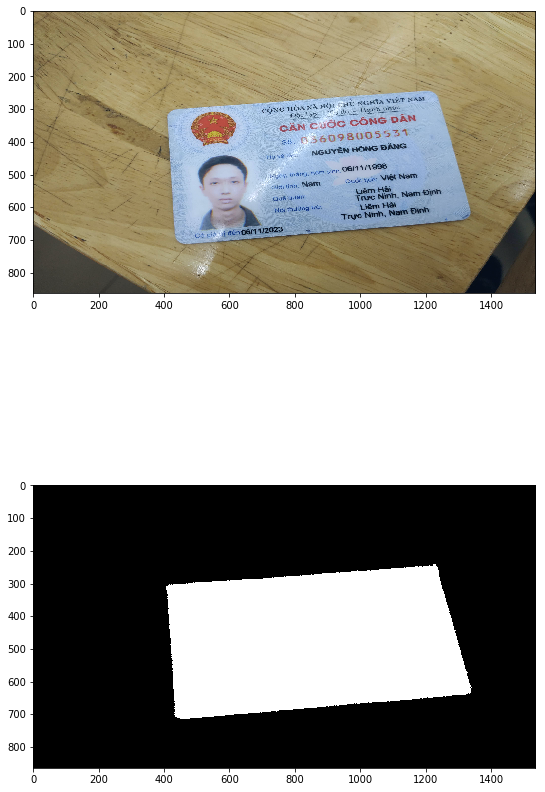

image27.png


W0724 19:26:02.074938 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


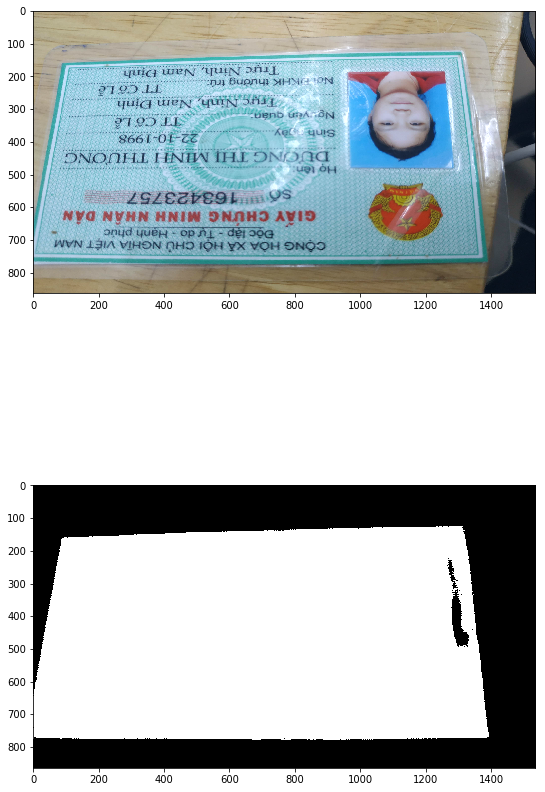

image2.png


W0724 19:26:03.395737 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


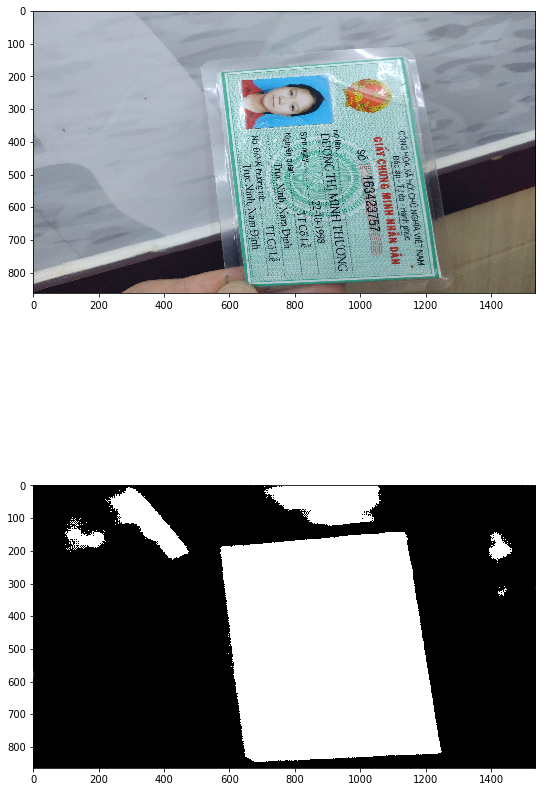

image4.png


W0724 19:26:04.888929 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


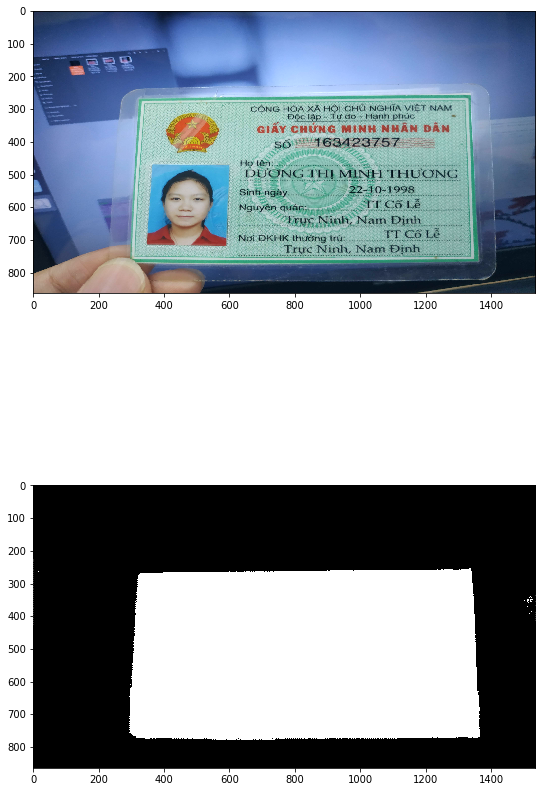

image4.png


W0724 19:26:06.220419 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


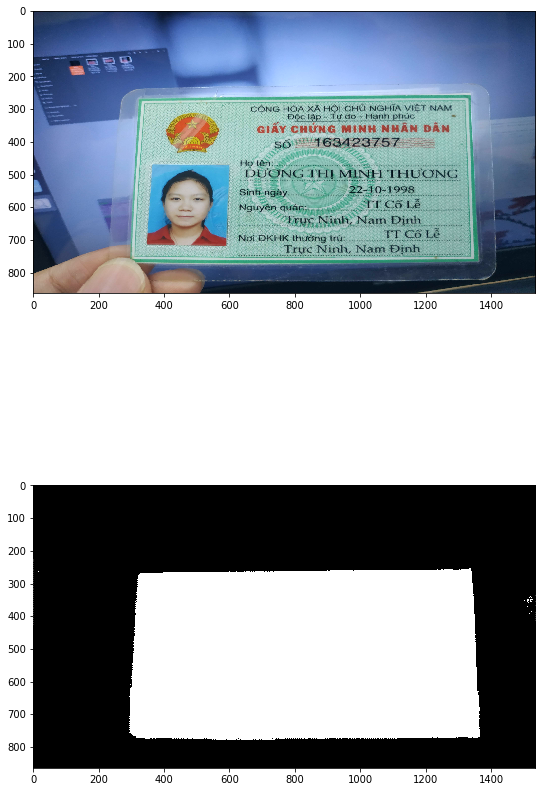

image1.png


W0724 19:26:07.531617 140567150233472 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(864, 1536, 1)


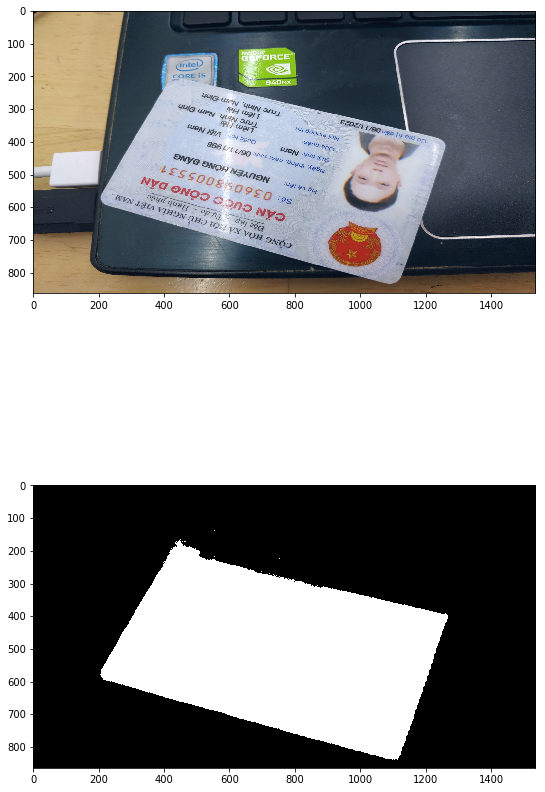

In [0]:
for path in random.choices(os.listdir('test/true_test_images/test_images'),k=20):
  print(path)
  predict(best_UNet,'test/true_test_images/test_images/'+path)

In [0]:
mkdir result

In [0]:
def predict_path(model,path):
  img = image.load_img(path, target_size=(864,1536))
  ori_img = image.img_to_array(img)
  img=preprocess_input(ori_img)
  img_in = np.expand_dims(img, axis=0)
  ret=(model.predict(img_in)[0]>0.5).astype(np.float32)
  print(ret.shape)
  
  image.save_img(os.path.join('result',os.path.basename(path)),ori_img)
  image.save_img(os.path.join('result','ret'+os.path.basename(path)),ret)

In [0]:
for path in os.listdir('test/true_test_images/test_images'):
  print(path)
  predict_path(best_UNet,'test/true_test_images/test_images/'+path)

image0.png
(864, 1536, 1)
image1.png
(864, 1536, 1)
image2.png
(864, 1536, 1)
image3.png
(864, 1536, 1)
image4.png
(864, 1536, 1)
image5.png
(864, 1536, 1)
image6.png
(864, 1536, 1)
image7.png
(864, 1536, 1)
image8.png
(864, 1536, 1)
image9.png
(864, 1536, 1)
image10.png
(864, 1536, 1)
image11.png
(864, 1536, 1)
image12.png
(864, 1536, 1)
image13.png
(864, 1536, 1)
image14.png
(864, 1536, 1)
image15.png
(864, 1536, 1)
image16.png
(864, 1536, 1)
image17.png
(864, 1536, 1)
image18.png
(864, 1536, 1)
image19.png
(864, 1536, 1)
image20.png
(864, 1536, 1)
image21.png
(864, 1536, 1)
image22.png
(864, 1536, 1)
image23.png
(864, 1536, 1)
image24.png
(864, 1536, 1)
image25.png
(864, 1536, 1)
image26.png
(864, 1536, 1)
image27.png
(864, 1536, 1)
image28.png
(864, 1536, 1)
image29.png
(864, 1536, 1)
image30.png
(864, 1536, 1)
image31.png
(864, 1536, 1)
image32.png
(864, 1536, 1)
image33.png
(864, 1536, 1)
image34.png
(864, 1536, 1)
image35.png
(864, 1536, 1)
image36.png
(864, 1536, 1)
image37.png